(HW2_2024)=
# HW2

**Deadline:** 03.11.2024 23:59 (GMT+5).

In this task you are suggested to implement gradient descent and Newton's optimization methods, and investigate their performance for three types of functions:

* quadratic function
* loss function of linear regression
* loss function of logistic regression

`BaseSmoothOracle` is an abstract class for objective function $f$ (**oracle**). Each concrete oracle must inherit this class, implementing four methods:

* `func(x)` calculates $f(\boldsymbol x)$
* `grad(x)` calculates $\nabla f(\boldsymbol x)$
* `hess(x)` calculates $\nabla^2 f(\boldsymbol x)$
* `get_opt(x)` calculates point of minimum by direct formula (works only for quadratic and linear regression oracles)

In [27]:
class BaseSmoothOracle(object):
    """
    Base class for implementation of oracles.
    """
    def func(self, x):
        """
        Computes the value of function at point x.
        """
        raise NotImplementedError('Func oracle is not implemented.')

    def grad(self, x):
        """
        Computes the gradient at point x.
        """
        raise NotImplementedError('Grad oracle is not implemented.')
    
    def hess(self, x):
        """
        Computes the Hessian matrix at point x.
        """
        raise NotImplementedError('Hessian oracle is not implemented.')
        
    def get_opt(self):
        """
        Computes the point x at which minimum is attained
        """
        raise NotImplementedError('True solution is unavailable.')

## Quadratic oracle

### Task 2.1 (1 point)

Implement quadratic oracle

```{math}
:label: quadratic-oracle
    f(\boldsymbol x) = \frac 12 \boldsymbol x^\mathsf{T} \boldsymbol{Ax} - \boldsymbol b^\mathsf{T} \boldsymbol x, \quad \boldsymbol A^\mathsf{T}  = \boldsymbol A \in \mathbb R^{n\times n}, \quad \boldsymbol b\in\mathbb R^n
```

<!-- Let $\boldsymbol A$ be a symmetric positive definite matrix. Solve the optimization task

$$
    f(\boldsymbol x) = \frac 12 \boldsymbol x^\mathsf{T} \boldsymbol{Ax} - \boldsymbol b^\mathsf{T}\boldsymbol x \to \min\limits_{\boldsymbol x \in \mathbb R^n}
$$

analytically. Namely, -->

Namely,

* find solution $\boldsymbol x_*$ of the equation $\nabla f(\boldsymbol x) = \boldsymbol 0$ 
* find hessian $\nabla^2 f$ and show that $\nabla^2 f(\boldsymbol x_*)$ is positive definite
* prove that $\boldsymbol x_*$ is the point of global minimum of $f$
* finally, fill the gaps in cell below

In [80]:
import numpy as np

class QuadraticOracle(BaseSmoothOracle):
    """
    Oracle for quadratic function:
       func(x) = 1/2 x^TAx - b^Tx.
    """

    def __init__(self, A, b):
        if not np.allclose(A, A.T):
            raise ValueError('A should be a symmetric matrix.')
        self.A = A
        self.b = b

    def func(self, x):
        return 0.5*x.T @ self.A @ x - self.b.T @ x

    def grad(self, x):
        return self.A @ x - self.b

    def hess(self, x):
        return self.A
    
    def get_opt(self):
        return np.linalg.solve(self.A, self.b)

Plot levels of the quadraric oracle in 2-dimensional case using the following function:

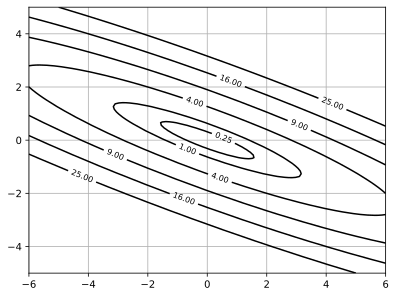

In [29]:
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'svg'

def plot_levels(func, xrange=None, yrange=None, levels=None):
    """
    Plotting the contour lines of the function.

    Example:
    --------
    >> oracle = QuadraticOracle(np.array([[1.0, 2.0], [2.0, 5.0]]), np.zeros(2))
    >> plot_levels(oracle.func)
    """
    if xrange is None:
        xrange = [-6, 6]
    if yrange is None:
        yrange = [-5, 5]
    if levels is None:
        levels = [0, 0.25, 1, 4, 9, 16, 25]
        
    x = np.linspace(xrange[0], xrange[1], 100)
    y = np.linspace(yrange[0], yrange[1], 100)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros(X.shape)
    for i in range(Z.shape[0]):
        for j in range(Z.shape[1]):
            Z[i, j] = func(np.array([X[i, j], Y[i, j]]))

    CS = plt.contour(X, Y, Z, levels=levels, colors='k')
    plt.clabel(CS, inline=1, fontsize=8) 
    plt.grid()   
oracle = QuadraticOracle(np.array([[1.0, 2.0], [2.0, 5.0]]), np.zeros(2))
plot_levels(oracle.func)

## Linear regression oracle

### Task 2.2 (1.5 points)

Implement linear regression oracle

$$
    f(\boldsymbol x) = \frac 1m \Vert \boldsymbol{Ax} - \boldsymbol b\Vert_2^2, \quad \boldsymbol A \in \mathbb R^{m\times n}, \quad \boldsymbol b \in \mathbb R^n.
$$

Namely,

* find $\nabla f(\boldsymbol x)$
* find $\nabla^2 f(\boldsymbol x)$
* find analytic solution of the minimization problem $f(\boldsymbol x) \to \min\limits_{\boldsymbol x}$
* finally, fill the gaps in the next cell

In [30]:
class LinRegOracle(BaseSmoothOracle):
    """
    Oracle for linear regression:
       func(x) = 1/m ||Ax - b||^2.
    """

    def __init__(self, A, b):
        self.A = A
        self.b = b
        self.m = A.shape[0]

    def func(self, x):
        resid = self.A @ x - self.b
        return (1/self.m)*(np.linalg.norm(resid)**2)

    def grad(self, x):
        resid = self.A @ x - self.b
        return (2/self.m)*(self.A.T @ resid)

    def hess(self, x):
        return (2 / self.m) * (self.A.T @ self.A)
    
    def get_opt(self):
        return np.linalg.inv(self.A.T @ self.A) @ (self.A.T @ self.b)


## Logistic regression oracle

### Task 2.3 (1.5 point)

Implement logistic regression oracle

```{math}
:label: log-reg-oracle
    f(\boldsymbol x) = \frac 1m \sum_{i=1}^m \log\big(1 + \exp(-b_i\boldsymbol a_i^\mathsf{T} \boldsymbol x)\big) + \frac C2\Vert \boldsymbol x\Vert_2^2
```

Namely, denote

$$
    \boldsymbol A = \begin{pmatrix} a_1^\mathsf{T} \\
    a_2^\mathsf{T} \\
    \vdots\\
    a_m^\mathsf{T}
    \end{pmatrix} \in \mathbb R^{m\times n}, \quad
    \boldsymbol b = \begin{pmatrix} b_1 \\
    b_2\\
    \vdots\\
    b_m
    \end{pmatrix}\in \mathbb R^m,
    \quad
    \boldsymbol x = \begin{pmatrix} x_1 \\
    x_2\\
    \vdots\\
    x_n
    \end{pmatrix}\in \mathbb R^n,
$$

and then

* find the gradient $\nabla f(\boldsymbol x)$ and hessian $\nabla^2 f(\boldsymbol x)$ of logistic regression oracle {eq}`log-reg-oracle` in matrix-vector form
* fill the gaps in the cell below 

In [31]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss
from scipy.special import expit

class LogRegOracle(BaseSmoothOracle):
    """
    Oracle for logistic regression.
    """

    def __init__(self, A, b, regcoef=1):
        self.A = A
        self.b = b
        self.C = regcoef
        self.m = A.shape[0]

    def func(self, x):
        linear_term = self.b * self.A.dot(x)
        return 0.5 * self.C * np.linalg.norm(x)**2 + np.mean(np.logaddexp(np.zeros_like(self.b), -linear_term))

    def grad(self, x):
        linear_term = self.b * (self.A @ x)
        sigmoid_term = expit(-linear_term)  
        grad_term = -self.A.T @ (self.b * sigmoid_term)
        return (1 / self.m) * grad_term + self.C * x
        
    def hess(self, x):
        linear_term = self.b * (self.A @ x)
        sigmoid_term = expit(linear_term) * (1 - expit(linear_term))
        D = np.diag(sigmoid_term)
        return (1 / self.m) * (self.A.T @ D @ self.A) + self.C * np.eye(self.A.shape[1])

    
    def get_opt(self):
        """
        Since there is no analytic solution for the optimal weights of logistic regression, 
        here we have to cheat a bit
        """
        LR = LogisticRegression(fit_intercept=False, C= 1./self.C/self.A.shape[0])
        LR.fit(self.A, (self.b + 1) / 2)
        return LR.coef_[0]

## Gradient descent

Given a starting point $\boldsymbol x_0 \in\mathbb R^n$ and learning rate $\eta > 0$, iteratively calculate

$$
    \boldsymbol x_{k+1} = \boldsymbol x_k - \eta \nabla f(\boldsymbol x_k), \quad k = 0, 1,\ldots
$$

The process should stop when either $k = \mathrm{max\_iter}$ or 

$$
\Vert \nabla f(\boldsymbol x_k)\Vert_2^2 \leqslant \varepsilon \Vert \nabla f(\boldsymbol x_0)\Vert_2^2
$$

where $\varepsilon > 0$ is tolerance.

### Task 2.4 (1 point)

Complete the implementation of gradient descent algorithm.

In [32]:
from datetime import datetime
from collections import defaultdict

def gradient_descent(oracle, x_0, learning_rate, tolerance=1e-5, max_iter=10000,
                     trace=False, display=False):
    """
    Gradient descent optimization method.

    Parameters
    ----------
    oracle : BaseSmoothOracle-descendant object
        Oracle with .func(), .grad() and .hess() methods implemented for computing
        function value, its gradient and Hessian respectively.
    x_0 : np.array
        Starting point for optimization algorithm.
    learning_rate : float
        Learning rate.
    tolerance : float
        Epsilon value for stopping criterion.
    max_iter : int
        Maximum number of iterations.
    trace : bool
        If True, the progress information is appended into history dictionary during training.
        Otherwise None is returned instead of history.
    display : bool
        If True, debug information is displayed during optimization.
        Printing format and is up to a student and is not checked in any way.

    Returns
    -------
    x_star : np.array
        The point found by the optimization procedure
    message : string
        "success" or the description of error:
            - 'iterations_exceeded': if after max_iter iterations of the method x_k still doesn't satisfy
                the stopping criterion.
            - 'computational_error': in case of getting Infinity or None value during the computations.
    history : dictionary of lists or None
        Dictionary containing the progress information or None if trace=False.
        Dictionary has to be organized as follows:
            - history['time'] : list of floats, containing time in seconds passed from the start of the method
            - history['func'] : list of function values f(x_k) on every step of the algorithm
            - history['grad_norm'] : list of values Euclidian norms ||g(x_k)|| of the gradient on every step of the algorithm
            - history['x'] : list of np.arrays, containing the trajectory of the algorithm. ONLY STORE IF x.size <= 2

    Example:
    --------
    >> oracle = QuadraticOracle(np.eye(5), np.arange(5))
    >> x_opt, message, history = gradient_descent(oracle, np.zeros(5))
    >> print('Found optimal point: {}'.format(x_opt))
       Found optimal point: [ 0.  1.  2.  3.  4.]
    """
    history = defaultdict(list) if trace else None
    x_k = np.copy(x_0)
    grad_at_x_0 = oracle.grad(x_0)

    INF = 1e100
    start_time = datetime.now()

    for i in range(max_iter + 1):     
        grad_at_x_k = oracle.grad(x_k)
        if np.any(np.abs(x_k) > INF) or np.any(np.abs(grad_at_x_k) > INF):
            return x_k, 'computational_error', history

        if trace:
            history['time'].append((datetime.now() - start_time).microseconds * 1e-6)
            history['func'].append(oracle.func(x_k))
            history['grad_norm'].append(np.linalg.norm(grad_at_x_k))
            if x_k.shape[0] <= 2:
                history['x'].append(np.array(x_k))

        if display:
            print("iteration {}: |x_k-x_0| = {}, f(x_k) = {}, |grad(f(x_k))| = {}".format(
                i, np.linalg.norm(x_k - x_0), oracle.func(x_k), np.linalg.norm(grad_at_x_k))
            )

        # YOUR CODE HERE
        if np.linalg.norm(grad_at_x_k) <= np.sqrt(tolerance) * np.linalg.norm(grad_at_x_0):
            return x_k, 'success', history

        x_k -= learning_rate * grad_at_x_k
    return x_k, 'iterations_exceeded', history
        
oracle = QuadraticOracle(np.eye(5), np.arange(5))
x_opt, message, history = gradient_descent(oracle, np.zeros(5), 1)
print('Found optimal point: {}'.format(x_opt))

Found optimal point: [0. 1. 2. 3. 4.]


Now it's try to test gradient descent algorithm on different tasks. Here is some auxiliary code for visualization.

In [33]:
import colorsys

def get_color_array(size):
    HSV_tuples = [(float(i) / size, 1.0, 1.0) for i in range(size)]
    RGB_tuples = list(map(lambda x: colorsys.hsv_to_rgb(*x), HSV_tuples))
    return np.array(RGB_tuples)

def plot_2d(history, oracle, x_0, x_opt, scale, title, n_levels=3, xlims=None, ylims=None, bound=None):
    if bound is not None:
        history['x'] = history['x'][:bound]
    hist_x = np.array(history['x']).T
    plt.figure(figsize=(12, 5))
    plt.subplot(121)
    
    plt.plot(np.linalg.norm(hist_x - x_opt[:, None], axis=0), c='c', linewidth=3)
    plt.plot(history['grad_norm'], c='m', linewidth=2)
    plt.xlim(0, len(history['grad_norm']) - 1)
    plt.ylim(0, 2)
    plt.title(title)
    plt.ylabel('Gradients/residuals norm')
    plt.xlabel('Iteration')
    plt.legend(['Residuals', 'Gradients'])
    plt.grid(ls=":")
    
    plt.subplot(122)
    if xlims is not None:
        x_range = xlims
    else:
        x_range = [x_opt[0] - scale, x_opt[0] + scale]
    if ylims is not None:
        y_range = ylims
    else:
        y_range = [x_opt[1] - scale, x_opt[1] + scale]
    func_opt = oracle.func(x_opt)
    levels = [func_opt + 0.25 * scale / n_levels * i for i in range(1, 4*n_levels + 1, 4)]
    # sizes = np.minimum(5 * float(hist_x.shape[1]) / (np.arange(1, hist_x.shape[1] + 1)), 20)
    plt.scatter(hist_x[0], hist_x[1], s=8, c=get_color_array(hist_x.shape[1]))
    plt.plot(hist_x[0], hist_x[1], alpha=0.6, ls="--", c='r')
    # plt.plot(hist_x[0], hist_x[1], c='r', linewidth=3)
    plt.scatter(x_opt[0], x_opt[1], marker='s', c='r', edgecolors='k')
    plot_levels(oracle.func, xrange=x_range, yrange=y_range, levels=levels)
    plt.title('Trajectory')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.grid(ls=":")
    if xlims is not None:
        plt.xlim(xlims)
    if ylims is not None:
        plt.ylim(ylims)
    plt.show()

def test_2d(method, oracle, x_0, lr, tol=1e-5, scale=1.0, xlims=None, ylims=None, bound=None):
    x_opt = oracle.get_opt()
    if method == 'gd':
        x_star, msg, history = gradient_descent(
            oracle, x_0, lr, tol, trace=True
        )
    elif method == 'newton':
        x_star, msg, history = newton(
            oracle, x_0, lr, tol, trace=True
        )
    else:
        raise ValueError("Unknown error")
    print(msg, len(history['grad_norm']), "iterations")
    plot_2d(history, oracle, x_0, x_opt, scale, 'lr = {}'.format(lr), xlims=xlims, ylims=ylims, bound=bound)

Take a simple quadratic function

$$
    f(x, y) = 2x^2 + 4xy + 5 y^2
$$

which ovbiously has minimum at $(0, 0)$. Now run gradient descent method with $\eta = 0.01$, starting from point $(-2, -1)$:

success 367 iterations


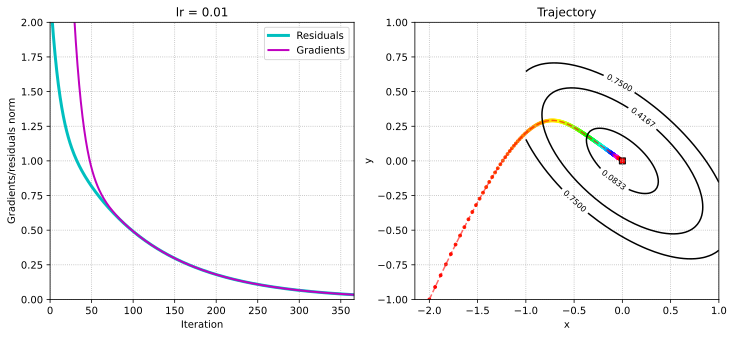

In [34]:
import numpy as np

A = np.array([[2, 2], [2, 5]])
b = np.zeros(2)
q_oracle = QuadraticOracle(A, b)
test_2d("gd", q_oracle, np.array([-2.0, -1.0]), lr=0.01)

If you did all correctly, gradient descent should converge here to optimal point. But this is not always the case:

* if $\eta$ is very small, convergence could be too slow
* if $\eta$ is very big, than gradient descent often diverges

### Task 2.5 (1 point)

Take previous quadratic oracle and try different learning rates and starting points. Find the smallest and the largest learning rates for which gradient descent is still convergent. Provide some characteristic plots. Also, plot a graph of required iterations versus $\eta$.

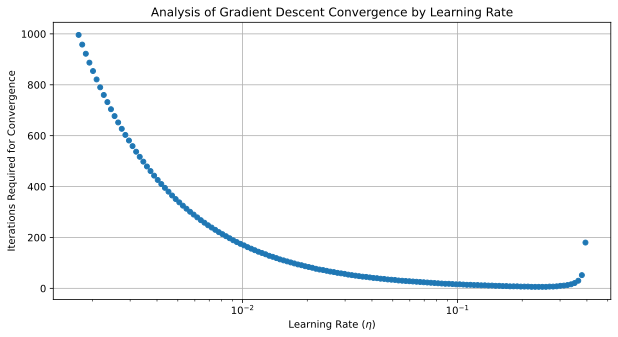

In [35]:
import numpy as np
import matplotlib.pyplot as plt

A = np.array([[3.0, 0.0], [0.0, 5.0]])
b = np.array([0.0, 1.0])
oracle = QuadraticOracle(A, b)

x_0 = np.array([2.0, 2.0], dtype=float)

learning_rates = np.logspace(-4, 1, 300)

convergence_results = []
iterations_required = []

for eta in learning_rates:
    x_star, message, history = gradient_descent(oracle, x_0, eta, max_iter=1000, trace=True)
    converged = (message == 'success')
    convergence_results.append(converged)
    iterations_required.append(len(history['func']) if converged else None)

converged_rates = np.array(learning_rates)[np.array(convergence_results)]
converged_iterations = np.array(iterations_required)[np.array(convergence_results)]

plt.figure(figsize=(10, 5))
plt.semilogx(converged_rates, converged_iterations, marker='o', linestyle='', markersize=5)
plt.xlabel('Learning Rate ($\eta$)')
plt.ylabel('Iterations Required for Convergence')
plt.title('Analysis of Gradient Descent Convergence by Learning Rate')
plt.grid(True)
plt.show()


### GD for linear regression

Let's try it for simple linear regression. Here is a toy example:

success 282 iterations


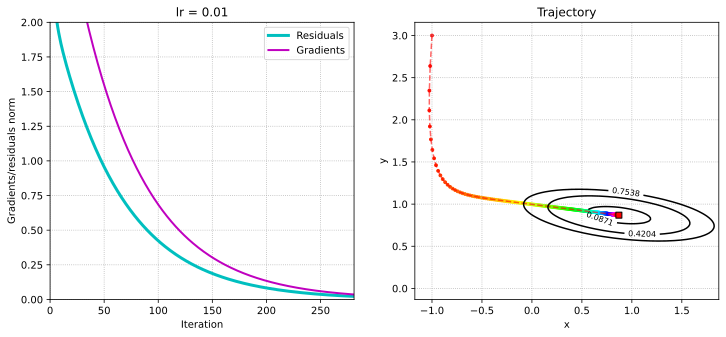

In [36]:
A = np.array([[1, -2.1], [1, 1.2], [1, 4.8]])
b = np.array([-1, 2, 5])
oracle = LinRegOracle(A, b)
test_2d("gd", oracle, np.array([-1, 3.0]), lr=0.01, tol=1e-6)

### Task 2.6 (0.5 points)

Apply gradient descent algorithm to simple linear regression trained on `boston` dataset. Take `lstat` as feature, `medv` as target. Provide some visualizations.

iterations_exceeded 10001 iterations


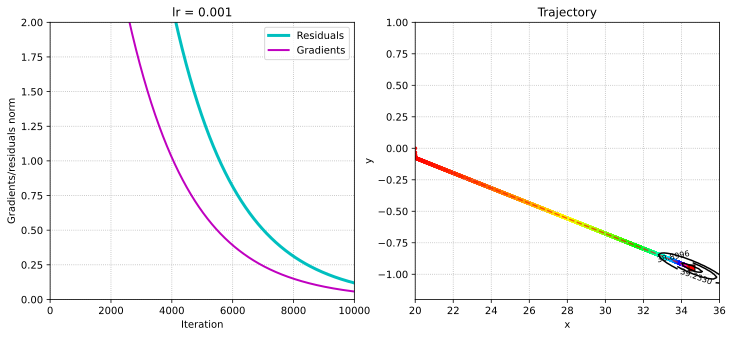

In [38]:
import pandas as pd
boston = pd.read_csv("Boston.csv").drop("Unnamed: 0", axis=1)

X = np.vstack((np.ones(boston.shape[0]), boston['lstat'])).T
y = boston['medv']

oracle = LinRegOracle(X, y)
test_2d("gd", oracle, np.array([20., 0.]), lr=0.001, tol=1e-8, xlims=[20, 36], ylims=[-1.2, 1])

### GD for logistic regression

The targets must be from $\{-1, 1\}$. One more toy example:

success 525 iterations


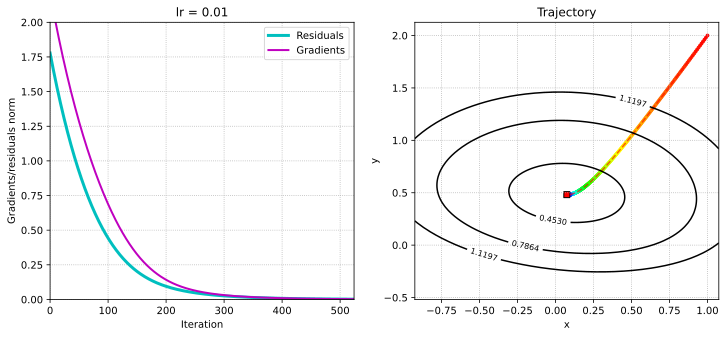

In [39]:
A = np.array([[1, -2.1], [1, 1.2], [1, 4.8], [1, 3.4]])
b = np.array([-1, 1, 1, 1])
oracle = LogRegOracle(A, b)
test_2d("gd", oracle, np.array([1., 2.0]), lr=0.01, tol=1e-6)

### Task 2.7 (0.5 points)

Train simple logistic regression model on `breast_cancer` dataset using your gradient descent method. Take any feature from the dataset. Visualize the results.

success 298 iterations


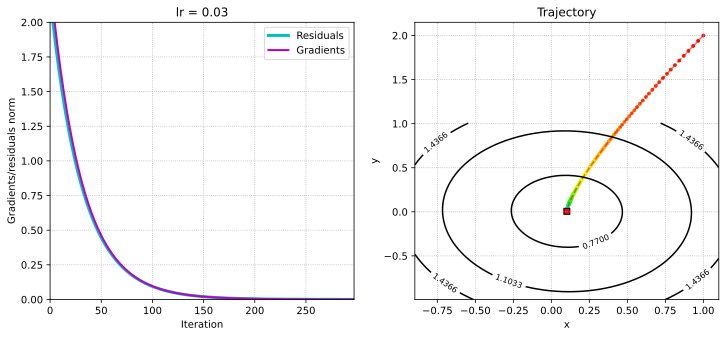

In [40]:
from sklearn.datasets import load_breast_cancer
breast = load_breast_cancer()
y = breast['target']
y[y == 0] = -1

X = np.hstack((np.ones(breast['data'].shape[0])[:, None], breast['data'][:, -1][:, None]))

oracle = LogRegOracle(X, y)
test_2d("gd", oracle, np.array([1., 2.]), lr=0.03, tol=1e-8)

## Newton's method

Given a starting point $\boldsymbol x_0 \in\mathbb R^n$ and learning rate $\eta > 0$, iteratively calculate

$$
    \boldsymbol x_{k+1} = \boldsymbol x_k - \eta \big(\nabla^2 f(\boldsymbol x_k)\big)^{-1} \nabla f(\boldsymbol x_k), \quad k = 0, 1,\ldots
$$

The process should stop when either $k = \mathrm{max\_iter}$ or 

$$
\Vert \nabla f(\boldsymbol x_k)\Vert_2^2 \leqslant \varepsilon \Vert \nabla f(\boldsymbol x_0)\Vert_2^2
$$

where $\varepsilon > 0$ is tolerance.

### Task 2.8 (1 point)

Complete the implementation of Newton's method.

In [41]:
import scipy

def newton(oracle, x_0, learning_rate, tolerance=1e-5, max_iter=100, trace=False, display=False):
    """
    Newton's optimization method.

    Parameters
    ----------
    oracle : BaseSmoothOracle-descendant object
        Oracle with .func(), .grad() and .hess() methods implemented for computing
        function value, its gradient and Hessian respectively. If the Hessian
        returned by the oracle is not positive-definite method stops with message="newton_direction_error"
    x_0 : np.array
        Starting point for optimization algorithm
    learning_rate : float
        Learning rate.
    tolerance : float
        Epsilon value for stopping criterion.
    max_iter : int
        Maximum number of iterations.
    trace : bool
        If True, the progress information is appended into history dictionary during training.
        Otherwise None is returned instead of history.
    display : bool
        If True, debug information is displayed during optimization.

    Returns
    -------
    x_star : np.array
        The point found by the optimization procedure
    message : string
        'success' or the description of error:
            - 'iterations_exceeded': if after max_iter iterations of the method x_k still doesn't satisfy
                the stopping criterion.
            - 'newton_direction_error': in case of failure of solving linear system with Hessian matrix (e.g. non-invertible matrix).
            - 'computational_error': in case of getting Infinity or None value during the computations.
    history : dictionary of lists or None
        Dictionary containing the progress information or None if trace=False.
        Dictionary has to be organized as follows:
            - history['time'] : list of floats, containing time passed from the start of the method
            - history['func'] : list of function values f(x_k) on every step of the algorithm
            - history['grad_norm'] : list of values Euclidian norms ||g(x_k)|| of the gradient on every step of the algorithm
            - history['x'] : list of np.arrays, containing the trajectory of the algorithm. ONLY STORE IF x.size <= 2

    Example:
    --------
    >> oracle = QuadraticOracle(np.eye(5), np.arange(5))
    >> x_opt, message, history = newton(oracle, np.zeros(5), line_search_options={'method': 'Constant', 'c': 1.0})
    >> print('Found optimal point: {}'.format(x_opt))
       Found optimal point: [ 0.  1.  2.  3.  4.]
    """
    history = defaultdict(list) if trace else None
    x_k = np.copy(x_0)
    grad_at_x_0 = oracle.grad(x_0)

    INF = 1e100
    start_time = datetime.now()

    for i in range(max_iter + 1): 
        grad_at_x_k = oracle.grad(x_k)
        hess_at_x_k = oracle.hess(x_k)  

        if np.any(np.abs(x_k) > INF) or np.any(np.abs(grad_at_x_k) > INF):
            return x_k, 'computational_error', history

        if trace:
            history['time'].append((datetime.now() - start_time).seconds)
            history['func'].append(oracle.func(x_k))
            history['grad_norm'].append(np.linalg.norm(grad_at_x_k))
            if x_k.shape[0] <= 2:
                history['x'].append(np.array(x_k))

        if display:
            print("iteration {}: |x_k-x_0| = {}, f(x_k) = {}, |grad(f(x_k))| = {}".format(
                i, np.linalg.norm(x_k - x_0), oracle.func(x_k), np.linalg.norm(grad_at_x_k))
            )

        # YOUR CODE HERE
        try:
            d_k = scipy.linalg.cho_solve(scipy.linalg.cho_factor(hess_at_x_k, lower=True), grad_at_x_k)            
            
        except np.linalg.LinAlgError:
            return x_k, 'newton_direction_error', history

        if np.linalg.norm(grad_at_x_k) <= tolerance * np.linalg.norm(oracle.grad(x_0)):
            return x_k, 'success', history
        x_k -= learning_rate * d_k

    return x_k, 'iterations_exceeded', history

### Task 2.9 (1 point)

Apply Newton's methods to the previous tasks:

* quadratic function
* simple linear regression trained on `boston` dataset
* simple logistic regression trained on `breast_cancer` dataset

Compare the number of iterations and time execution of GD and Newton methods in this examples. Visualize your results.

In [63]:
from sklearn.datasets import load_breast_cancer
from scipy.special import expit as sigmoid
import pandas as pd
import time

def compare_methods(oracle, x_0, learning_rate, tolerance=1e-5, max_iter=100):
    start_time = time.time()
    x_opt_gd, message_gd, history_gd = gradient_descent(oracle, x_0, learning_rate, tolerance, max_iter, trace=True)
    gd_time = time.time() - start_time
    gd_iters = len(history_gd['func'])

    start_time = time.time()
    x_opt_newton, message_newton, history_newton = newton(oracle, x_0, learning_rate, tolerance, max_iter, trace=True)
    newton_time = time.time() - start_time
    newton_iters = len(history_newton['func'])

    return (x_opt_gd, message_gd, gd_iters, gd_time), (x_opt_newton, message_newton, newton_iters, newton_time)



In [64]:
A = np.eye(5)
b = np.arange(5)
oracle_quad = QuadraticOracle(A, b)
x_0_quad = np.zeros(5)
compare_methods(oracle_quad, x_0_quad, learning_rate=1)

((array([0., 1., 2., 3., 4.]), 'success', 2, 0.0007481575012207031),
 (array([0., 1., 2., 3., 4.]), 'success', 2, 0.001033782958984375))

In [65]:

boston = pd.read_csv("Boston.csv").drop("Unnamed: 0", axis=1)
X = np.hstack((np.ones(boston.shape[0])[:, None], boston.drop(["medv"], axis=1)))
y = boston['medv']
oracle = LinRegOracle(X, y)
x_0_linreg = np.zeros(X.shape[1])
compare_methods(oracle, x_0_linreg, learning_rate=1)

((array([-6.47712754e+96, -3.66300171e+97, -5.37563418e+97, -8.52614579e+97,
         -4.25979572e+95, -3.79933200e+96, -4.01621163e+97, -4.83039426e+98,
         -2.15580269e+97, -8.26877706e+97, -3.08723479e+99, -1.22166128e+98,
         -9.23368377e+97]),
  'computational_error',
  18,
  0.016129016876220703),
 (array([ 4.16172702e+01, -1.21388618e-01,  4.69634633e-02,  1.34676947e-02,
          2.83999338e+00, -1.87580220e+01,  3.65811904e+00,  3.61071055e-03,
         -1.49075365e+00,  2.89404521e-01, -1.26819813e-02, -9.37532900e-01,
         -5.52019101e-01]),
  'success',
  2,
  0.00795125961303711))

success 20 iterations


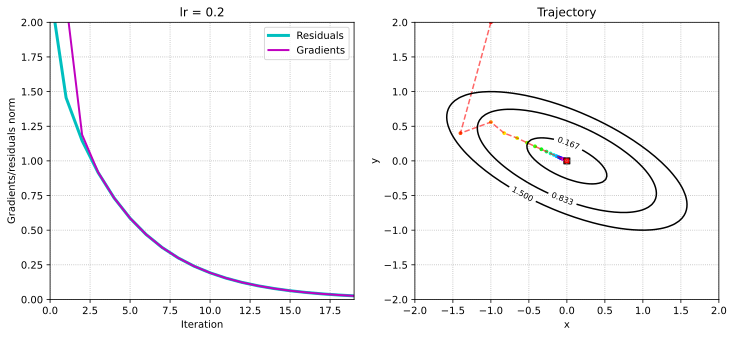

In [70]:
test_2d("gd", q_oracle, np.array([-1.0, 2.0]), lr=0.2, scale=2.0)

success 24 iterations


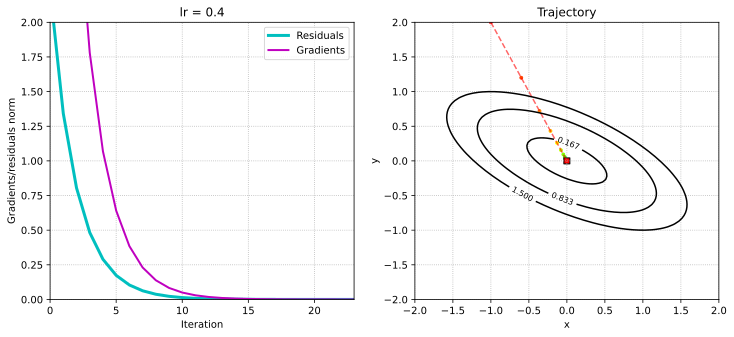

In [69]:
test_2d("newton", q_oracle, np.array([-1.0, 2.0]), lr=0.4, scale=2.0)

iterations_exceeded 10001 iterations


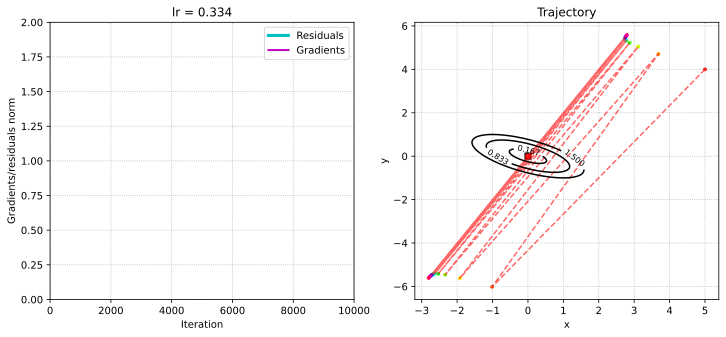

In [74]:
test_2d("gd", q_oracle, np.array([5, 4.0]), lr=0.334, scale=2.0, bound=20)

success 525 iterations


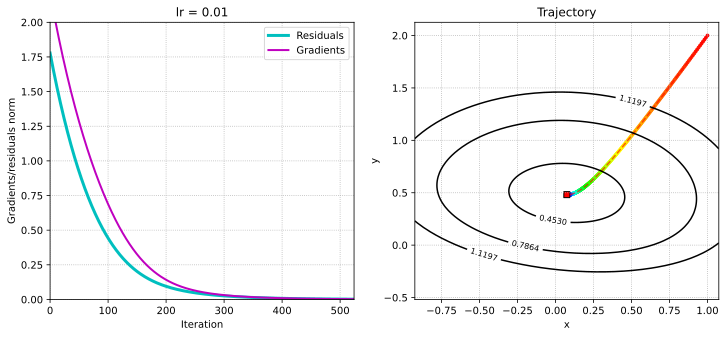

In [75]:
A = np.array([[1, -2.1], [1, 1.2], [1, 4.8], [1, 3.4]])
b = np.array([-1, 1, 1, 1])
oracle = LogRegOracle(A, b)
test_2d("gd", oracle, np.array([1., 2.0]), lr=0.01, tol=1e-6)

success 63 iterations


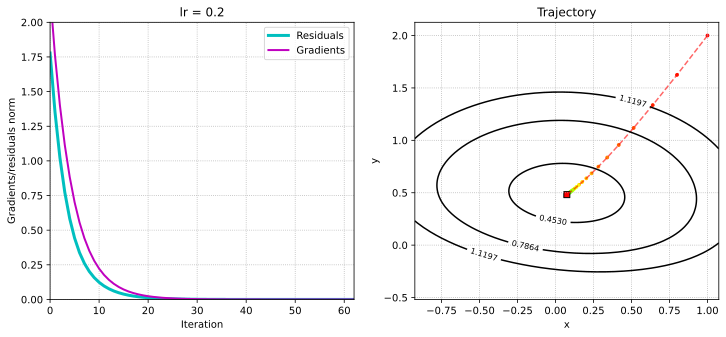

In [76]:

test_2d("newton", oracle, np.array([1., 2.0]), lr=0.2, tol=1e-6)

## GD vs Newton

### Task 2.10 (1 point)

Run both gradient descent and Newton's methods on **full** `boston` and `breast_cancer` datasets. Do they converge? How many iterations are required for convergence? How much time? Justify your answers by numeric experiments and visualizations.

In [78]:
boston = pd.read_csv("Boston.csv").drop("Unnamed: 0", axis=1)
X = np.hstack((np.ones(boston.shape[0])[:, None], boston.drop(["medv"], axis=1)))
y = boston['medv']
oracle = LinRegOracle(X, y)
x_star, msg, history = gradient_descent(
    oracle, np.zeros(X.shape[1]), 1e-6, tolerance=1e-8, max_iter=2*10**4, display=True, trace=True
)

iteration 0: |x_k-x_0| = 0.0, f(x_k) = 592.1469169960475, |grad(f(x_k))| = 17245.335951862977
iteration 1: |x_k-x_0| = 0.017245335951862974, f(x_k) = 354.373076569584, |grad(f(x_k))| = 10331.98479471063
iteration 2: |x_k-x_0| = 0.02757614293934827, f(x_k) = 268.99498940129456, |grad(f(x_k))| = 6198.091693120723
iteration 3: |x_k-x_0| = 0.033769399590766455, f(x_k) = 238.23880542670426, |grad(f(x_k))| = 3731.4791810015013
iteration 4: |x_k-x_0| = 0.037487778682850234, f(x_k) = 227.06050098153827, |grad(f(x_k))| = 2268.269897962366
iteration 5: |x_k-x_0| = 0.03972677374999621, f(x_k) = 222.89962515919382, |grad(f(x_k))| = 1413.5719841934804
iteration 6: |x_k-x_0| = 0.04108239907835986, f(x_k) = 221.25427070018398, |grad(f(x_k))| = 932.7111417625899
iteration 7: |x_k-x_0| = 0.0419114734054253, f(x_k) = 220.51086692917232, |grad(f(x_k))| = 682.0775342705615
iteration 8: |x_k-x_0| = 0.042427593768797, f(x_k) = 220.09107839419917, |grad(f(x_k))| = 565.536923493343
iteration 9: |x_k-x_0| = 0.

In [79]:
np.linalg.norm(oracle.get_opt() - x_star)

45.873098480883115

In [81]:
boston = pd.read_csv("Boston.csv").drop("Unnamed: 0", axis=1)
X = np.hstack((np.ones(boston.shape[0])[:, None], boston.drop(["medv"], axis=1)))
y = boston['medv']
oracle = LinRegOracle(X, y)
x_star, msg, history = newton(
    oracle, np.zeros(X.shape[1]), 1e-6, tolerance=1e-8, max_iter=2*10**4, display=True, trace=True
)

iteration 0: |x_k-x_0| = 0.0, f(x_k) = 592.1469169960475, |grad(f(x_k))| = 17245.335951862977
iteration 1: |x_k-x_0| = 4.5921836355359754e-05, f(x_k) = 592.1457775621458, |grad(f(x_k))| = 17245.31870652703
iteration 2: |x_k-x_0| = 9.184362678888961e-05, f(x_k) = 592.1446381305233, |grad(f(x_k))| = 17245.30146120832
iteration 3: |x_k-x_0| = 0.00013776537130062678, f(x_k) = 592.14349870118, |grad(f(x_k))| = 17245.284215906853
iteration 4: |x_k-x_0| = 0.00018368706989061327, f(x_k) = 592.1423592741152, |grad(f(x_k))| = 17245.266970622648
iteration 5: |x_k-x_0| = 0.00022960872255890143, f(x_k) = 592.1412198493291, |grad(f(x_k))| = 17245.249725355665
iteration 6: |x_k-x_0| = 0.0002755303293055353, f(x_k) = 592.1400804268219, |grad(f(x_k))| = 17245.23248010594
iteration 7: |x_k-x_0| = 0.0003214518901305728, f(x_k) = 592.1389410065938, |grad(f(x_k))| = 17245.215234873467
iteration 8: |x_k-x_0| = 0.0003673734050340414, f(x_k) = 592.1378015886443, |grad(f(x_k))| = 17245.19798965823
iteration 9:

In [87]:
from sklearn.datasets import load_breast_cancer
breast = load_breast_cancer()
y = breast['target']
y[y == 0] = -1

X = np.hstack((np.ones(breast['data'].shape[0])[:, None], breast['data'][:, -1][:, None]))
oracle = LogRegOracle(X, y)
x_star, msg, history = gradient_descent(
    oracle, np.zeros(X.shape[1]), 1e-6, tolerance=1e-8, max_iter=2*10**4, display=True, trace=True
)


iteration 0: |x_k-x_0| = 0.0, f(x_k) = 0.6931471805599453, |grad(f(x_k))| = 0.1276593599921665
iteration 1: |x_k-x_0| = 1.2765935999216648e-07, f(x_k) = 0.6931471642630433, |grad(f(x_k))| = 0.12765920020866314
iteration 2: |x_k-x_0| = 2.553185602008296e-07, f(x_k) = 0.6931471479661822, |grad(f(x_k))| = 0.12765904042535958
iteration 3: |x_k-x_0| = 3.8297760062618915e-07, f(x_k) = 0.6931471316693617, |grad(f(x_k))| = 0.12765888064225622
iteration 4: |x_k-x_0| = 5.106364812684454e-07, f(x_k) = 0.6931471153725821, |grad(f(x_k))| = 0.1276587208593528
iteration 5: |x_k-x_0| = 6.382952021277982e-07, f(x_k) = 0.6931470990758434, |grad(f(x_k))| = 0.1276585610766494
iteration 6: |x_k-x_0| = 7.659537632044475e-07, f(x_k) = 0.6931470827791453, |grad(f(x_k))| = 0.12765840129414602
iteration 7: |x_k-x_0| = 8.936121644985935e-07, f(x_k) = 0.693147066482488, |grad(f(x_k))| = 0.1276582415118425
iteration 8: |x_k-x_0| = 1.021270406010436e-06, f(x_k) = 0.6931470501858716, |grad(f(x_k))| = 0.1276580817297

In [88]:
from sklearn.datasets import load_breast_cancer
breast = load_breast_cancer()
y = breast['target']
y[y == 0] = -1

X = np.hstack((np.ones(breast['data'].shape[0])[:, None], breast['data'][:, -1][:, None]))
oracle = LogRegOracle(X, y)
x_star, msg, history = newton(
    oracle, np.zeros(X.shape[1]), 1e-6, tolerance=1e-8, max_iter=2*10**4, display=True, trace=True
)

iteration 0: |x_k-x_0| = 0.0, f(x_k) = 0.6931471805599453, |grad(f(x_k))| = 0.1276593599921665
iteration 1: |x_k-x_0| = 1.0199779913149606e-07, f(x_k) = 0.6931471675391789, |grad(f(x_k))| = 0.12765923233280638
iteration 2: |x_k-x_0| = 2.0399549626519285e-07, f(x_k) = 0.6931471545184386, |grad(f(x_k))| = 0.1276591046735741
iteration 3: |x_k-x_0| = 3.059930914011927e-07, f(x_k) = 0.6931471414977246, |grad(f(x_k))| = 0.12765897701446938
iteration 4: |x_k-x_0| = 4.079905845395975e-07, f(x_k) = 0.6931471284770364, |grad(f(x_k))| = 0.12765884935549257
iteration 5: |x_k-x_0| = 5.0998797568051e-07, f(x_k) = 0.6931471154563742, |grad(f(x_k))| = 0.12765872169664313
iteration 6: |x_k-x_0| = 6.119852648240317e-07, f(x_k) = 0.6931471024357382, |grad(f(x_k))| = 0.12765859403792132
iteration 7: |x_k-x_0| = 7.13982451970265e-07, f(x_k) = 0.6931470894151281, |grad(f(x_k))| = 0.12765846637932743
iteration 8: |x_k-x_0| = 8.159795371193116e-07, f(x_k) = 0.6931470763945441, |grad(f(x_k))| = 0.1276583387208